# **ASSIGNMENT 4:CNN VISUALIZATIONS AND CREATIVE COMPUTER VISION**
------------------------------------------
Student Name: Varshitha Venkatesh

A\#: 

e-mail: 

-----------------------------------------
This assignment explores advanced techniques for visualizing and understanding Convolutional Neural Networks (CNNs), focusing on the creative applications of DeepDream and neural style transfer algorithms. Using pre-trained VGG16 and Inception V3 networks, students will delve into various aspects of CNN interpretation and image manipulation.

The assignment is structured around several key objectives:
* Visualization of CNN internals: Analyze per-layer and per-image feature maps
 and gain insights into how CNNs process visual information at different depths
* Occlusion experiments: Investigate which image regions are crucial for class prediction
* Image optimization: Generate images from fully connected layer embeddings
* Implementation of generative techniques: Develop a basic DeepDream generator using Inception V3 and create a neural style transfer algorithm

Students will work with TensorFlow's automatic differentiation for custom training loops, providing hands-on experience with modern deep learning tools. The assignment will culminate in a comparative analysis of DeepDream and neural style transfer outputs, offering a comprehensive understanding of these fascinating computer vision techniques.

By completing this assignment, students will gain practical skills in CNN visualization, deepen their understanding of neural network image processing, and explore the creative possibilities at the intersection of art and artificial intelligence.

There are **six activities** for you to complete. You can comiplete the activities in the recitation on November 6 and November 20. Please use Lecture slides 16-17 for your reference.

**BONUS POINTS** Students are encouraged to showcase their best DeepDream and neural style transfer images by submitting them in the designated "best images" folder. These images will be shared on Teams for a voting process among peers. **The creators of the top two images will receive a 5% bonus to their final grade**, providing a fantastic opportunity to enhance their academic performance. Additionally, students are invited to submit their creations to the [Science Photo Contest 2024](https://www.smu.ca/faculty-of-science/science-photo-contest.html), further promoting their artistic endeavors and creativity. This is a chance not only to earn recognition from your classmates but also to gain exposure in a broader artistic community!

**Due date:** *Please include your last name in the .ipynb file and submit the renamed file to Teams by* **November 20.** *For instance, a student with the last name 'abc' would rename their file to CNN_visualizations_activities_abc.ipynb.* Your submision notebook must have all the cells executed and the outputs displayed.


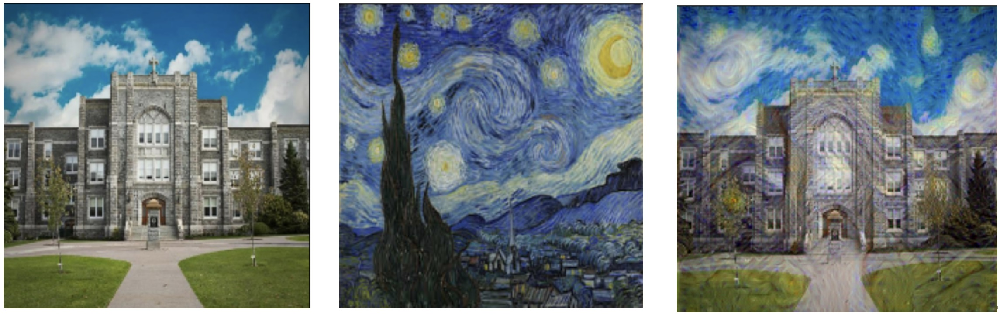

# **1. Environment Setup**
Let's get started!

As ussual, before executing the following python code, you have to upload the `CNN_Visualizations` folder to your Google drive. Download the project from MS Teams and upload it into the `My Drive/Colab Notebooks` of your google drive.Then mount the google drive and set the working directory to `My Drive/Colab Notebooks/CNN_Visualizations`.

In [1]:
import os
from google.colab import drive
drive.mount('/content/gdrive')
root_dir = "/content/gdrive/MyDrive/"
project_folder = "Colab Notebooks/CNN_Visualizations/"
os.chdir(root_dir+project_folder)

Mounted at /content/gdrive



Let us import the necessary libraries.

In [2]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications.inception_v3 import InceptionV3 # Import the InceptionV3 class
from tensorflow.keras.applications import VGG16 # Import the InceptionV3 class
import numpy as np
from keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt
from tensorflow.keras.applications.vgg16 import decode_predictions, preprocess_input



Next we will load the pre-trained VGG16 [4] model and define functions for image preprocessing. For some activities, we use only the feature extractor part of VGG16. In some other activities, full VGG16 model is used.

In [4]:
# Load VGG16 models, vgg_cnn is the cnn part of VGG16 and vgg_full is the full vgg16 model
vgg_cnn = VGG16(include_top=False, weights='imagenet')
vgg_full = VGG16(weights='imagenet')

def preprocess_image(image_path, target_size=(299, 299)):
    img = load_img(image_path, target_size=target_size)
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    return img

def deprocess_image(img):
    img = img.reshape((299, 299, 3))
    img /= 2.
    img += 0.5
    img *= 255.
    img = np.clip(img, 0, 255).astype('uint8')
    return img

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
553467096/553467096 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step


In [ ]:
print(vgg_full.summary())

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ fc1 (Dense)                          │ (None, 4096)                │     102,764,544 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 138,357,544 (527.79 MB)

 Trainable params: 138,357,544 (527.79 MB)

 Non-trainable params: 0 (0.00 B)

None


# **2. Feature Map Visualizations**

Convolutional Neural Network (CNN) feature visualization is a powerful technique that allows us to peek inside the "black box" of deep learning models and understand how they process visual information. In this section, we'll focus on two key activities to explore the inner workings of the VGG16 network, a popular pre-trained CNN architecture.

### **2.1 Layer-wise Feature Maps (5 Points)**

First, we'll perform per-layer visualizations of VGG16. This involves examining the features learned by different convolutional layers throughout the network. As we move deeper into the network, we'll observe how the visualizations progress from simple edge detectors to more complex, abstract representations. This activity provides insights into the hierarchical nature of feature learning in CNNs.

The following code creates a visualization of feature maps from a specified layer of a CNN for a given input image. It's a useful tool for understanding how the network processes and represents visual information at different stages.

In [ ]:

def visualize_feature_maps(model, img, layer_name):

    #create a new model that takes the same input as the original model but outputs the activations of the specified layer
    layer_output = model.get_layer(layer_name).output
    activation_model = tf.keras.models.Model(inputs=model.input, outputs=layer_output)

    #Generate the activations (feature maps) for the input image
    activations = activation_model.predict(img)

    #Sets the number of feature maps to display, we use 8
    n_features = min(8, activations.shape[-1])

    #Creates a 2x4 grid of subplots to display the feature maps
    fig, axs = plt.subplots(2, 4, figsize=(10, 10))

    # loop iterates through the feature maps, plotting each one in a subplot
    for i in range(n_features):
        ax = axs[i // 4, i % 4]
        ax.imshow(activations[0, :, :, i], cmap='viridis')
        ax.axis('off')
    plt.suptitle(f'Feature maps from layer: {layer_name}')
    plt.tight_layout()
    plt.show()

# Load and preprocess an image
image_path = './images/starry.jpg'  # Replace with your image path
img = preprocess_image(image_path)



The following code snippet visualizes feature maps from an early layer of a VGG16 convolutional neural network. You can use similar functions calls to visualize the feature maps of other layers of VGG16.

Visualizing feature maps from an early layer:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


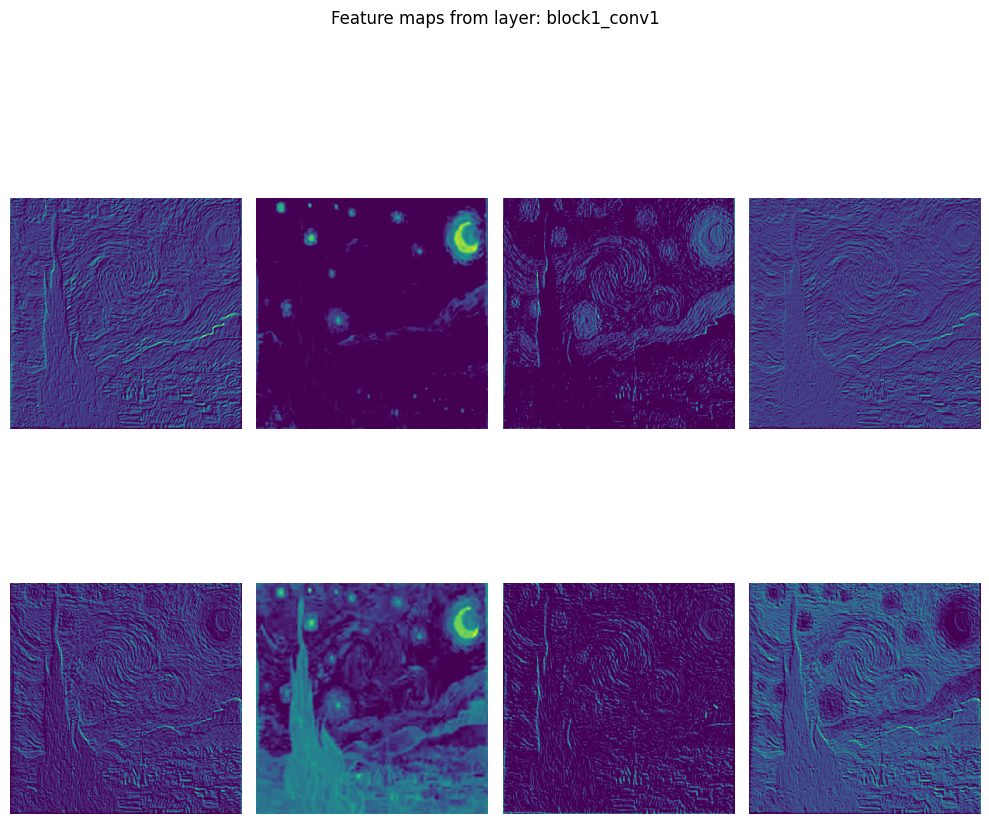

Visualizing feature maps from block2_conv1 layer:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


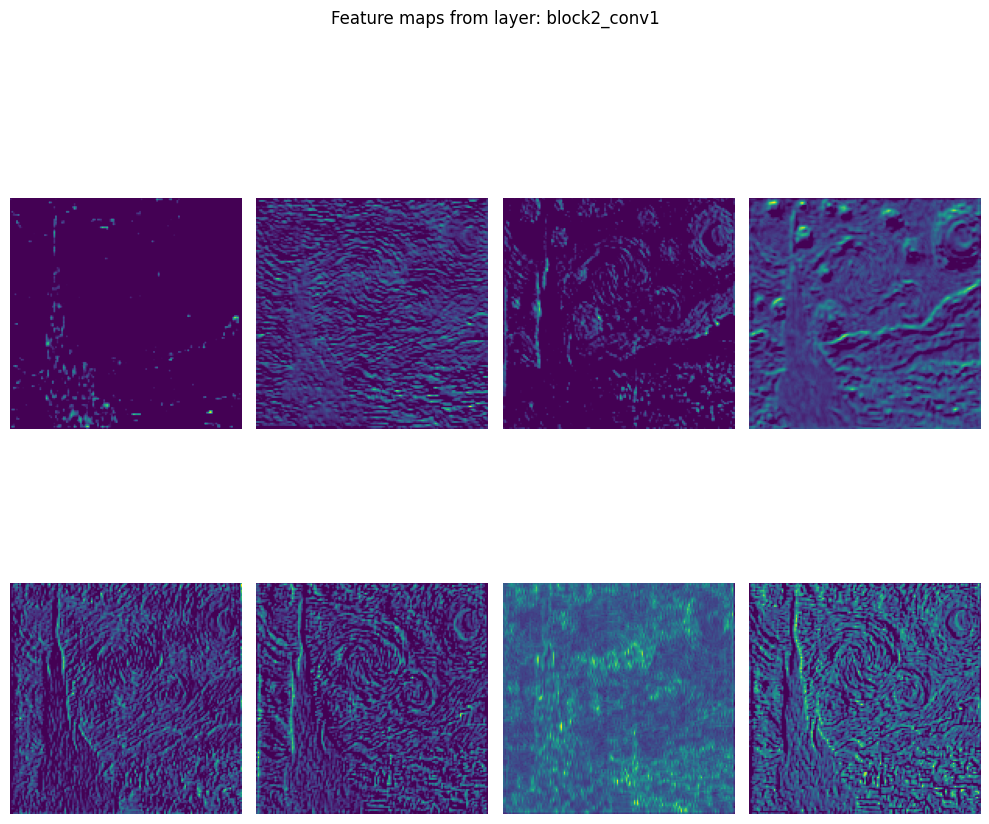

Visualizing feature maps from block3_conv1 layer:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


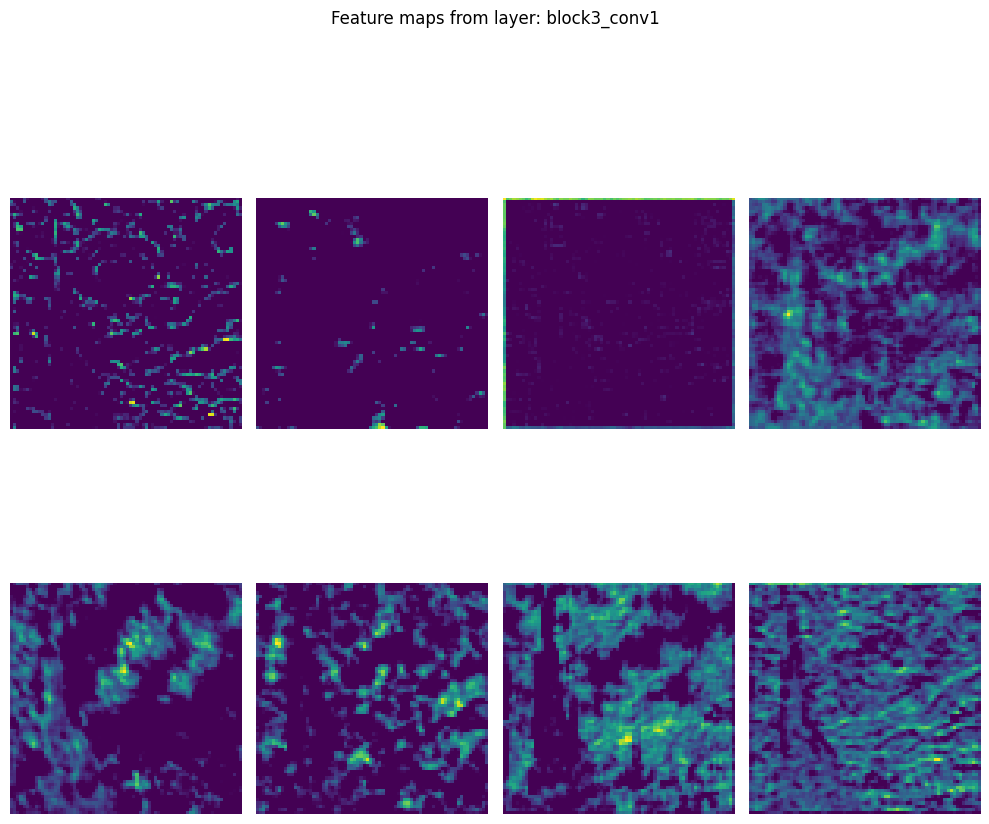

Visualizing feature maps from block4_conv1 layer:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


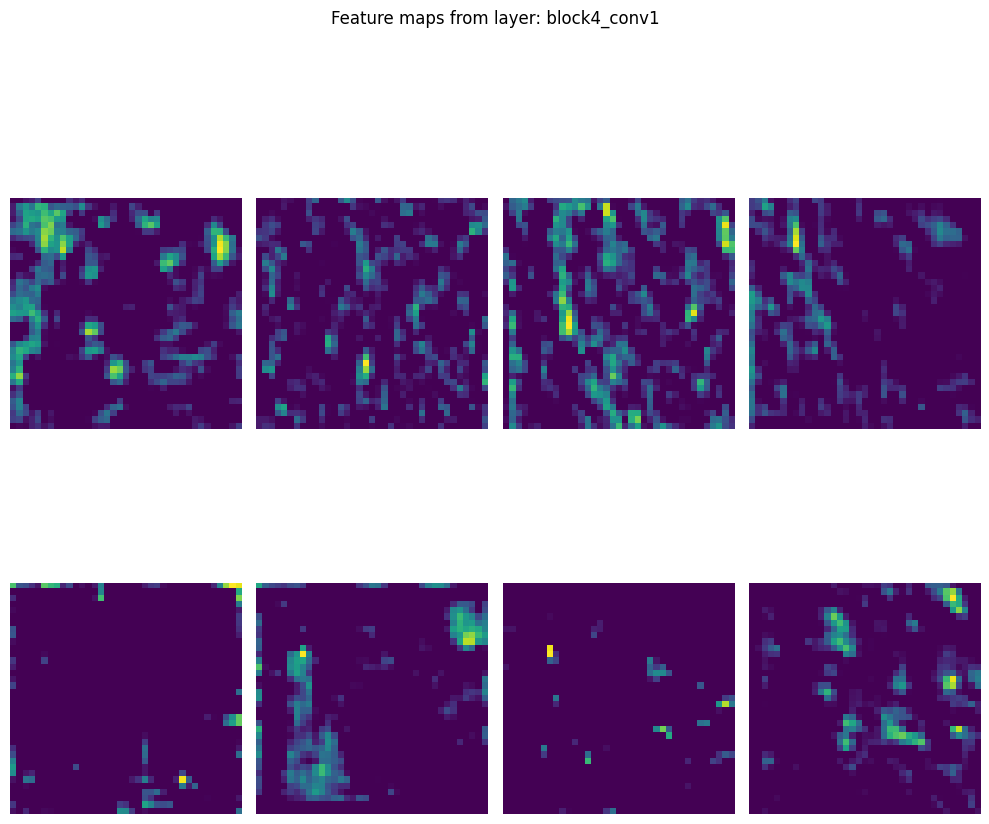

Visualizing feature maps from block5_conv1 layer:
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


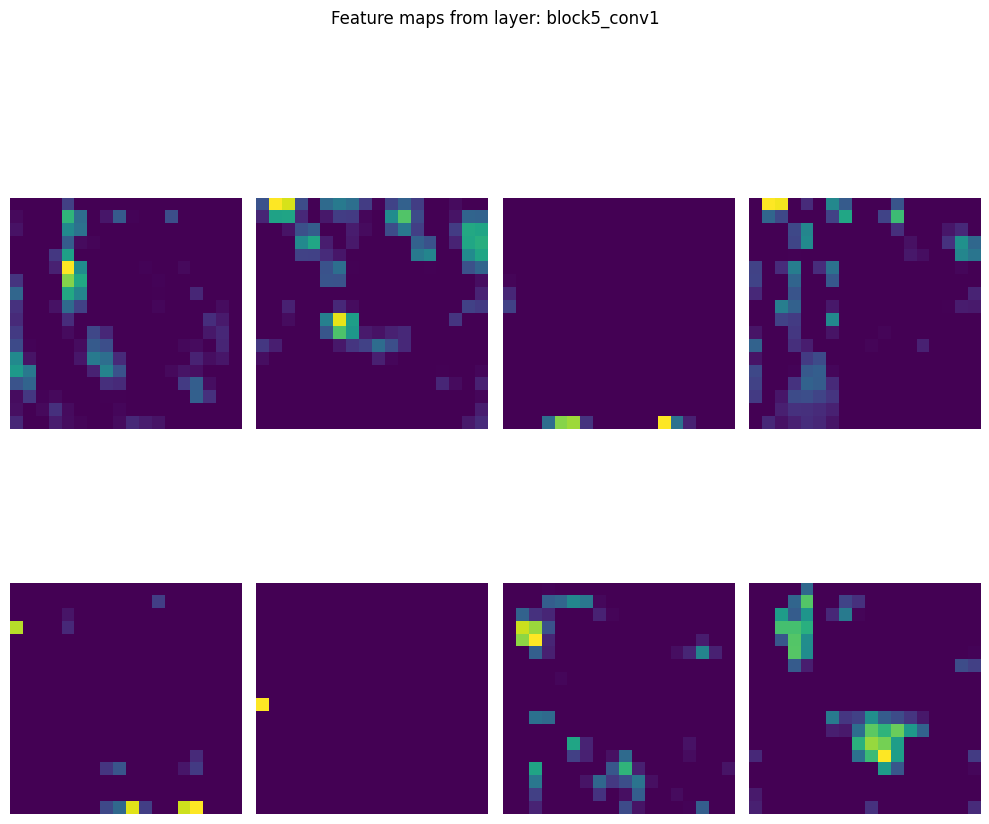

Visualizing feature maps from block5_pool layer:
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 594ms/step


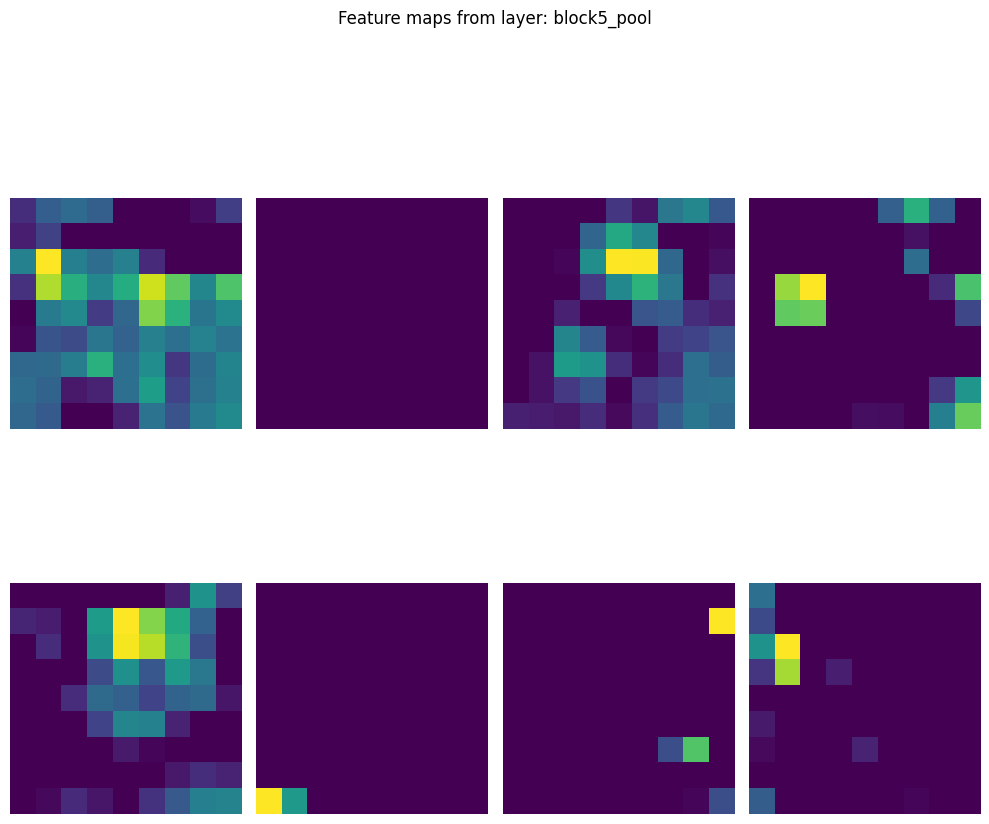

In [ ]:
#Activity 1 (Question 1): Choose your own image and visualize the fetaure maps of block 2-5 convolutions (conv1) and block 5 pool.

print("Visualizing feature maps from an early layer:")
visualize_feature_maps(vgg_cnn, img, 'block1_conv1')

print("Visualizing feature maps from block2_conv1 layer:")
visualize_feature_maps(vgg_cnn, img, 'block2_conv1')

print("Visualizing feature maps from block3_conv1 layer:")
visualize_feature_maps(vgg_cnn, img, 'block3_conv1')

print("Visualizing feature maps from block4_conv1 layer:")
visualize_feature_maps(vgg_cnn, img, 'block4_conv1')

print("Visualizing feature maps from block5_conv1 layer:")
visualize_feature_maps(vgg_cnn, img, 'block5_conv1')

print("Visualizing feature maps from block5_pool layer:")
visualize_feature_maps(vgg_cnn, img, 'block5_pool')

**Question 1 (5 Points):**  Using a pre-trained VGG16 model and an image of your choice, create visualizations of the feature maps for the following layers:
1. Block 2 Conv1 (block2_conv1)
2. Block 3 Conv1 (block3_conv1)
3. Block 4 Conv1 (block4_conv1)
4. Block 5 Conv1 (block5_conv1)
5. Block 5 Pool (block5_pool)

Analyze the resulting feature maps (generated above) and discuss how the visual representations change as you progress through the network. What patterns or characteristics do you observe in the feature maps at different depths of the network?





**Response:** In the early parts of VGG16, like `block2_conv1`, the feature maps start picking up simple details such as edges, corners, and textures. It's in these layers that images are analyzed based on patterns and basic shapes present in them. Images formed from these layers usually result in clear maps that appear to be parts of the actual image, showing small details like lines and simple color changes. These basic features prove essential in finding the central parts of an image and giving the model the grounds it requires in its seeking to obtain more advanced features.

The feature maps become more abstract as we go deeper in the network, such that in layers like `block5_conv1` and `block5_pool`, we no longer observe single edges or textures; rather, high-level features are presented, such as specific parts or even whole objects. Pooling operations reduce resolution in the feature maps. They retain the most relevant information, filtering out unimportant details. The patterns in deeper layers normally emerge in groups or as sparse activations. This shows that the model focuses on selected areas that are strong in object recognition. It is in this step-by-step process that there is a nice transition from small details to overall meaning in how a convolutional neural network learns complex patterns from images.



### **2.2 Feature Maps of Various Images (10 Points)**
Second, we'll conduct per-image feature visualizations. This technique allows us to see which parts of a specific input image activate particular neurons or channels within the network. By doing so, we can gain a better understanding of what the network "looks at" when making predictions, helping to demystify its decision-making process.



In [ ]:
def compare_feature_maps(image_paths, layer_name='block1_conv1'):

    # Create a new model that outputs the specified layer's activations
    layer_outputs = [layer.output for layer in vgg_cnn.layers if layer.name == layer_name]
    activation_model = tf.keras.models.Model(inputs=vgg_cnn.input, outputs=layer_outputs)

    # Load and preprocess images
    images = []
    for path in image_paths:
        img_array = preprocess_image(path)
        images.append(img_array)

    # Get activations for each image
    activations = [activation_model.predict(img) for img in images]

    # Plot feature maps
    fig, axes = plt.subplots(len(image_paths), 8, figsize=(20, 5 * len(image_paths)))

    for i, activation in enumerate(activations):
        for j in range(8):  # Display first 8 feature maps
            ax = axes[i, j] if len(image_paths) > 1 else axes[j]
            ax.imshow(activation[0][:, :, j], cmap='viridis')
            ax.axis('off')

        axes[i, 0].set_ylabel(f'Image {i+1}', size='large')

    plt.suptitle(f'Feature Maps Comparison - Layer: {layer_name}', size='x-large')
    plt.tight_layout()
    plt.show()

The following code visualizes the feature maps of three images given in the project folder. You have to choose four images (other than the ones given in the project folder) and do a comparative analysis.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


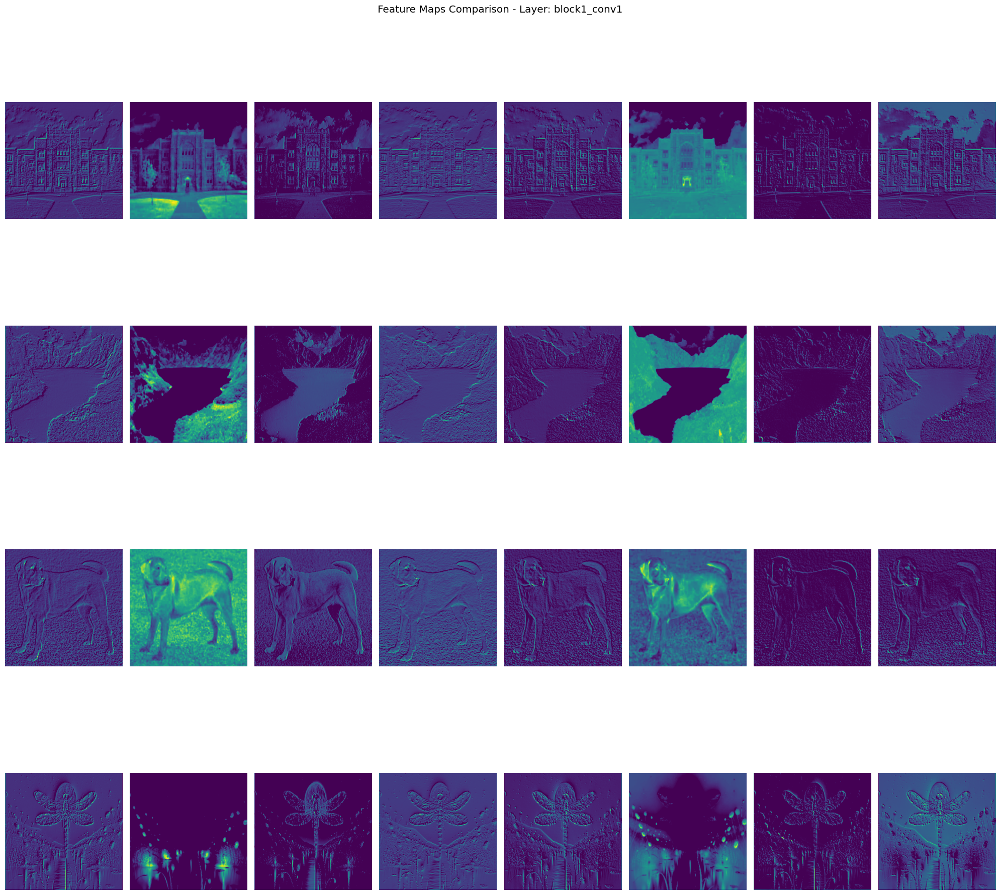

In [ ]:
#Activity 2 (Question 2) Choose your own images (4 images ) and visualize the feature maps with comparison.
image_paths = ['./images/McNally.jpg', './images/lake.jpg', './images/dog.jpg', './images/butterfly.jpg']
compare_feature_maps(image_paths, layer_name='block1_conv1')

# You can use this space to write the code for generating your visualization. Include the visualizations in your submission.

**Question 2 (10 Points):** Using the pre-trained VGG16 model, visualize and compare the feature maps for four different images of your choice. Select one early layer (e.g., 'block1_conv2'), one middle layer (e.g., 'block3_conv3'), and one deep layer (e.g., 'block5_conv3') for visualization. Analyze the following aspects:
1. How do the feature maps differ between the four images at each selected layer?
2. How does the complexity and abstraction of features change as you move from early to deep layers for each image?
3. Are there any notable patterns or activations specific to certain types of images or objects within them?
4. Compare the feature maps of similar objects or scenes across different images. What similarities or differences do you observe?

Provide a brief analysis of your observations, focusing on how the VGG16 network processes and represents various visual features across different types of images and network depths.

**Response:**


### Differences at Each Layer:

Early Layers: Detect basic edges and textures; same across images.

Middle Layers: Capture patterns and object parts; differences are noticeable.

Deep Layers: Represent whole objects; differences are very distinct.


### Complexity Across Layers:

Early layers show simple features.

Middle layers show textures and patterns.

Deep layers show abstract objects and concepts.


### Patterns Specific to Images:

Textured objects activate middle layers.

Complex scenes strongly activate deep layers.


### Similar Objects Across Images:


Similar objects share activations in deep layers.

Differences come from lighting, angle, or background.



# **3. Occlusion Experiment (20 Points)**

The occlusion experiment [3] is a technique used to understand which parts of an image are most important for a Convolutional Neural Network's (CNN) classification decision. This method provides insights into the model's decision-making process by systematically obscuring different parts of the input image and observing how it affects the model's predictions. It works on the principle that if an important part of the image is obscured, the model's confidence in its prediction should decrease significantly. Conversely, if an unimportant part is obscured, the prediction should remain relatively unchanged. By applying this technique across the entire image, we can create a heatmap that highlights the regions most critical to the model's decision.

The process involves the following steps:


1.   Start with an input image and obtain the model's initial prediction.
2.   Systematically occlude small patches of the image (typically using a sliding window approach). We use a patch size of 50.
3. For each occluded version, record the change in the model's prediction confidence.
4. Create a heatmap where the intensity represents the importance of each region.

The following code performs an occlusion experiment to visualize which parts of an image are most important for the model's prediction. Here's what you need to do to complete the code:
1. In the first blank, you need to set the value for the occluded patch. What value should you use to "remove" this part of the image?
2. For the model.predict() function, what input should you provide?
3. When extracting prob, which class probability are we interested in? (Hint: Look at the variable name we used earlier in the code.)
4. How do you calculate the sensitivity? [Hint: Sensitivity shows how much the probability changes when we occlude part of the image. Subtract ```prob``` from the ```original_prob```].
5. Finally, how should you update the heatmap? What value should you add to the current patch in the heatmap?





In [ ]:
#Activity 3: complete the loop for occlusion experiment

def get_img_array(img_path, target_size):
    img = load_img(img_path, target_size=target_size)
    array = img_to_array(img)
    array = np.expand_dims(array, axis=0)
    return preprocess_input(array)

def occlusion_experiment(model, img_path, target_class, patch_size=50, stride=10):
    # Load and preprocess the image
    x = get_img_array(img_path, target_size=(224, 224))

    # Get the original prediction
    original_pred = model.predict(x)
    original_prob = original_pred[0, target_class]

    # Create a heatmap to store sensitivity
    heatmap = np.zeros((224, 224))

    # Perform occlusion experiment
    for i in range(0, 224 - patch_size, stride):
        for j in range(0, 224 - patch_size, stride):
            # Create a copy of the image with the patch occluded
            occluded_img = x.copy()
            occluded_img[0, i:i+patch_size, j:j+patch_size, :] = 0

            # Get the new prediction
            pred = model.predict(occluded_img) # occluded image
            prob = pred[0, target_class] # target class

            # Calculate sensitivity.
            sensitivity = original_prob - prob # diff between original probability and expected probab
            heatmap[i:i+patch_size, j:j+patch_size] += sensitivity

    return heatmap



The following is the driver code for the occlusion experiment.  It first loads and preprocesses an image, invokes the ```occlusion_experiment()```, creating a heatmap of sensitivity. Finally, it visualizes the results by displaying the original image alongside the heatmap overlaid on the image, showing which areas are most important for the model's classification decision.

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━

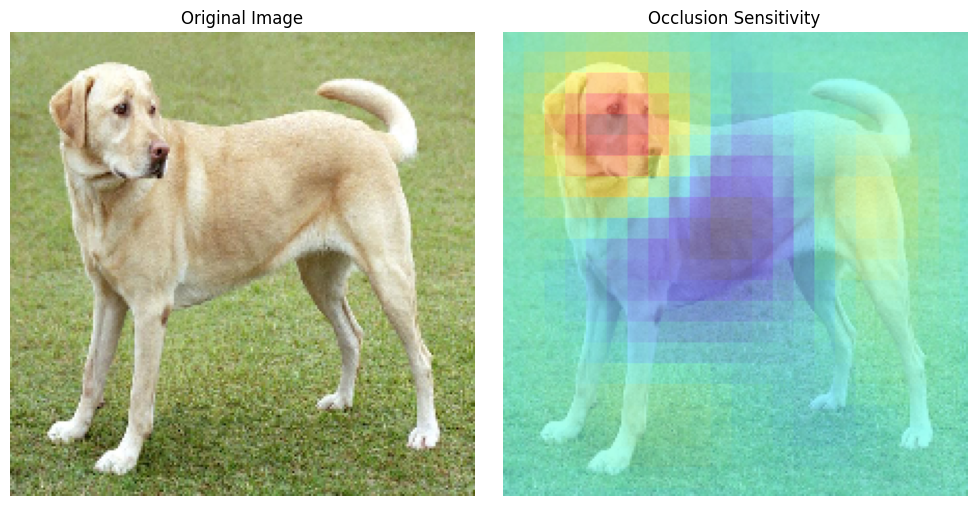

35363/35363 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Predicted: [('n02099712', 'Labrador_retriever', 0.3591732)]


In [ ]:

# Path to your image
img_path = './images/dog.jpg'

# Load and preprocess the image
img_array = get_img_array(img_path, target_size=(224, 224))

# Make a prediction
preds = vgg_full.predict(img_array)
top_pred_class = np.argmax(preds[0])

# Perform occlusion experiment
heatmap = occlusion_experiment(vgg_full, img_path, top_pred_class)

# Visualize the results
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(load_img(img_path, target_size=(224, 224)))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(load_img(img_path, target_size=(224, 224)), alpha=0.6)
plt.imshow(heatmap, cmap='jet', alpha=0.4)
plt.title('Occlusion Sensitivity')
plt.axis('off')

plt.tight_layout()
plt.show()

# Print the predicted class
print('Predicted:', decode_predictions(preds, top=1)[0])

# **4. Create Images from Embeddings (20 Points)**

In this activity, we'll start with a zero image and optimize it to match the embeddings from the 4096-dimensional FC layer of a reference image using the VGG16 model (refer to Lect. 16). This activity will help you learn and use custom training loop (Lect. 17) in the context of image optimization.



In [3]:
def preprocess_image(image_path):
    img = load_img(image_path, target_size=(224, 224))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return preprocess_input(img_array)

def deprocess_image(img):
    img = img.numpy()
    img = np.squeeze(img)
    img = img.astype(np.uint8)
    return img


reference_image_path = './images/McNally.jpg'
reference_image = preprocess_image(reference_image_path)

#Choose the layer for the reference embedding. You can try out different layers of vgg to do this experiment.
fc_layer_model = keras.Model(inputs=vgg_full.input, outputs=vgg_full.get_layer('block1_conv1').output)
reference_embedding = fc_layer_model.predict(reference_image)

#Initialize an image with random values as the starting image
trainable_image = tf.Variable(tf.random.uniform((1, 224, 224, 3), 0, 255))
initial_image = deprocess_image(trainable_image)

#Loss and optimizer
loss_fn = tf.keras.losses.MeanSquaredError()
optimizer = tf.keras.optimizers.Adam(learning_rate=0.1)




NameError: name 'vgg_full' is not defined

The code snippet below demonstrates the use of TensorFlow's GradientTape to optimize an image based on its embedding. The code starts by creating a GradientTape context. This "tape" records operations for automatic differentiation, i.e., it acts as a context manager that records operations executed within its scope. It tracks and records operations in the forward pass. During the backward pass, it uses these recorded operations to compute gradients in reverse order.

In the below code, inside the GradientTape context:
* The trainable image is preprocessed using a function called preprocess_input.
* The preprocessed image is passed through a model (fc_layer_model) to get its embedding.
* A loss is calculated by comparing this embedding to a reference embedding using a loss function (loss_fn).

After the computations, the tape.gradient() method is called to compute the gradients of the loss with respect to the trainable image.

Finally, these gradients are applied to the trainable image using an optimizer. This step adjusts the pixel values of the image to minimize the loss.

```@tf.function``` is a decorator in TensorFlow that converts a Python function into a TensorFlow graph. Here are the key points about @tf.function:
Purpose:

* It compiles a Python function into a TensorFlow graph for faster execution.
* Allows TensorFlow to optimize the function for better performance.

How it works:
When a function is decorated with ```@tf.function```, TensorFlow traces the function to create a computational graph. This graph can then be executed more efficiently than the original Python code.

Benefits:
Improved performance, especially for complex computations. Enables running the function on different devices (CPU, GPU, TPU) without code changes.
Allows for better optimization by TensorFlow's runtime.

Your task: Complete the ```train_step()``` function by filling in the blanks and answer the questions. The function performs one step of training to optimize an image based on its embedding similarity to a reference image.

**Hints:**
1. For preprocessing the image, use the appropriate function (refer to the previous code).
2. To get the embedding, use the model that extracts features from the image.
3. The loss function should compare the reference embedding with the current image's embedding.
4. To compute gradients, use the appropriate method of the GradientTape object [```tape.gradient()```].
5. An optimizer object should be used to apply the gradients.
6. To clip values, use the appropriate TensorFlow function that limits values to a specified range [```tf.clip_by_value()```].

In [ ]:
#Activity 4: Complete the code for training.

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # Preprocess the trainable image
        # preprocessed_image = preprocess_image(trainable_image)
        # Get embedding of the trainable image
        embedding = fc_layer_model(trainable_image)
        # Calculate loss
        loss = loss_fn(reference_embedding, embedding)

    # Compute gradients
    grads = tape.gradient(loss, trainable_image)
    # Apply gradients
    optimizer.apply_gradients([(grads, trainable_image)])
    # Clip pixel values to [0, 255]
    clipped = tf.clip_by_value(trainable_image, 0, 255)
    trainable_image.assign(clipped)

    return loss


Next, write your main training loop.

In [ ]:
# Training loop
num_iterations = 1000
for i in range(num_iterations):
    loss = train_step()
    if i % 100 == 0:
        print(f"Iteration {i}, Loss: {loss.numpy():.4f}")

Iteration 0, Loss: 6638.3315
Iteration 100, Loss: 5642.2300
Iteration 200, Loss: 4885.9844
Iteration 300, Loss: 4280.1768
Iteration 400, Loss: 3779.0332
Iteration 500, Loss: 3358.7776
Iteration 600, Loss: 3004.1353
Iteration 700, Loss: 2704.1033
Iteration 800, Loss: 2449.8406
Iteration 900, Loss: 2232.9326


Visualize the generated image along with the intial random image and reference images.

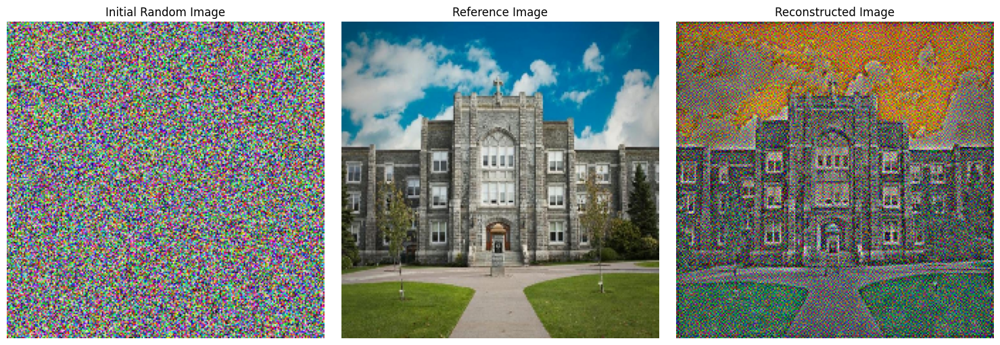

In [ ]:
# Get the final optimized image
final_image = deprocess_image(trainable_image)


plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(initial_image)
plt.title('Initial Random Image')
plt.axis('off')

plt.subplot(1, 3, 2)
display_image = reference_image[0] + [103.939, 116.779, 123.68]
display_image = display_image[:, :, ::-1]  # BGR -> RGB
display_image = np.clip(display_image, 0, 255).astype(np.uint8)
plt.imshow(display_image)
#plt.imshow(reference_image[0])  # Adding 0.5 to denormalize
plt.title('Reference Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(final_image)
plt.title('Reconstructed Image')
plt.axis('off')

plt.tight_layout()
plt.show()

# **5. Deep Dream Algorithm Implementation (25 Points)**

Now, let's implement the Deep Dream algorithm discussed in Lect. 17. Deep Dream uses neural networks to generate dreamlike, surreal images. Developed by Google engineer Alexander Mordvintsev [1], Deep Dream works by enhancing patterns that a trained convolutional neural network detects in an input image. In this activity, we'll implement our own version of Deep Dream using TensorFlow. We'll start with a pre-trained image classification model (Inception V3 [5] for this activity), then use gradient ascent to modify an input image in ways that amplify the activations of specific layers in the network. By the end, you'll be able to create your own psychedelic, hallucination-like images and gain insight into how neural networks "see" and process visual information.

You can find two functions in the nelow cell.
1. ```deep_dream(model, img, iterations=20, learning_rate=0.01)```:
This function implements the core Deep Dream algorithm. It iteratively modifies an input image to maximize the activations of a specific layer in the neural network, creating dream-like effects.
2. ```visualize_deep_dream(model, img, layer_name, iterations=500, learning_rate=0.001)```:
This function uses the deep_dream() function to generate a series of increasingly dream-like images, saves them as individual frames, and combines them into an animated GIF to visualize the Deep Dream process.

Your task is to complete the ```deep_dream()``` function by filling in the blanks. This function implements the Deep Dream algorithm using gradient ascent to maximize the activations of a specific layer in the neural network.

**Hints:**
* The function modifies an input image, so consider what variable needs to be watched by the GradientTape. By default, GradientTape automatically watches ```tf.Variables``` but not regular tensors. In the following code, we want the ```GradientTape``` to track operations performed on the ```img``` tensor.
* The model takes an image (```img```) as input to produce activations.
* The loss is calculated using the square of the activations.
* Gradient tape computes the gradients of the loss with respect to the input image.
* The image is updated using the computed gradients and the learning rate. This is the gradient ascent algorithm.
* The clip_by_value function is used to keep pixel values within a specific range ([-1, 1] in this example).


In [ ]:
import imageio
from IPython.display import Image, display

#Activity 5 (Also see Question 3): complete the deep dream function using gradient ascent (10 Points)


def deep_dream(model, img, iterations=20, learning_rate=0.01):
    for n in range(iterations):
        with tf.GradientTape() as tape:
            tape.watch(img)
            activations = model(img)
            loss = tf.reduce_mean(tf.square(activations))

        gradients = tape.gradient(loss, img)
        # Normalize gradients
        gradients /= tf.math.reduce_std(gradients) + 1e-8

        # Update the image
        img = img + learning_rate * gradients
        img = tf.clip_by_value(img, -1.0, 1.0)

    return img


def visualize_deep_dream(model, img, layer_name, iterations=500, learning_rate=0.001):
    dream_model = tf.keras.models.Model(inputs=model.input, outputs=model.get_layer(layer_name).output)
    img_tensor = tf.convert_to_tensor(img)

    frames = []
    os.makedirs('./images/results', exist_ok=True)

    for i in range(20):
        img_tensor = deep_dream(dream_model, img_tensor, iterations=100, learning_rate=learning_rate)
        frame = deprocess_image(img_tensor.numpy())
        frames.append(frame)

        # Save individual frame
        plt.figure(figsize=(10, 10))
        plt.imshow(frame)
        plt.title(f'Iteration {(i+1)*25}')
        plt.axis('off')
        plt.savefig(os.path.join('./images/results', f'deep_dream_iteration_{(i+1)*25}.png'),
                    bbox_inches='tight', pad_inches=0)
        plt.close()

    # Create and save GIF
    gif_path = os.path.join('./images/results', 'deep_dream_animation.gif')
    imageio.mimsave(gif_path, frames, fps=2)

    # Display the GIF in Colab
    display(Image(filename=gif_path))



The following code loads the inception_v3 model and the starting image, and invokes the ```visualize_deep_dream()``` function to generates the deep dream images.

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Generating Deep Dream visualization:


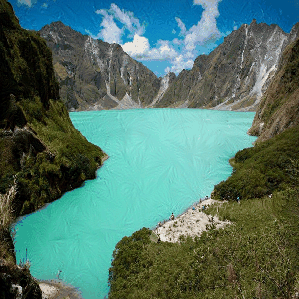

In [ ]:
# Generate Deep Dream visualizations

def preprocess_image(image_path, target_size=(299, 299)):
    img = load_img(image_path, target_size=target_size)
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    return img

def deprocess_image(img):
    img = img.reshape((299, 299, 3))
    img /= 2.
    img += 0.5
    img *= 255.
    img = np.clip(img, 0, 255).astype('uint8')
    return img

inception_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')

print("Generating Deep Dream visualization:")
image_path = './images/lake.jpg'
img = preprocess_image(image_path)  # Make sure to define this function
layer_name = 'mixed5'  # Choose a layer name from the InceptionV3 model

visualize_deep_dream(inception_model, img, layer_name)

**Question 3 (15 Points):** In our deep dream implementation, we currently use the mean of squared activations as our maximization target. This is just one approach to maximizing layer activations. Experiment with different maximization functions and observe how they affect the resulting DeepDream images. Implement and compare the following alternatives:
1. L2 norm of activations (```loss = tf.norm(activations)```)
2. Mean of activations without squaring (```loss = tf.reduce_mean(activations)```)
3. Sum of squared activations (```loss = tf.reduce_sum(tf.square(activations))```)

L2 Norm of Activations: Produces balanced and smoother patterns, emphasizing overall activation magnitude without biasing extreme values.

Mean of Activations without squaring: Creates subtle and less exaggerated patterns, as it focuses on the average activation instead of intensifying strong ones.

Sum of Squared Activations: Generates exaggerated and detailed images, emphasizing high-energy features and intricate patterns.

# **6. Neural Style Transfer using VGG16 (20 Points)**
Neural style transfer combines the content of one image with the artistic style of another. Developed by Gatys et al. in 2015 [2], this method uses convolutional neural networks to separate and recombine the content and style of different images. In this activity, we'll implement neural style transfer using TensorFlow and a pre-trained VGG16 network. We'll learn how to extract content and style representations from images, define appropriate loss functions, and use optimization techniques to generate a new image that merges the content of one image with the style of another. By the end of this activity, you'll be able to create your own unique artistic renditions and gain insights into how neural networks can be used for creative applications in computer vision.

This code snippet below demonstrates how to load and preprocess content and style images for a neural style transfer task. Feel free to use different content and style images to generate your neural art. You can run the eblow code to see your input images.

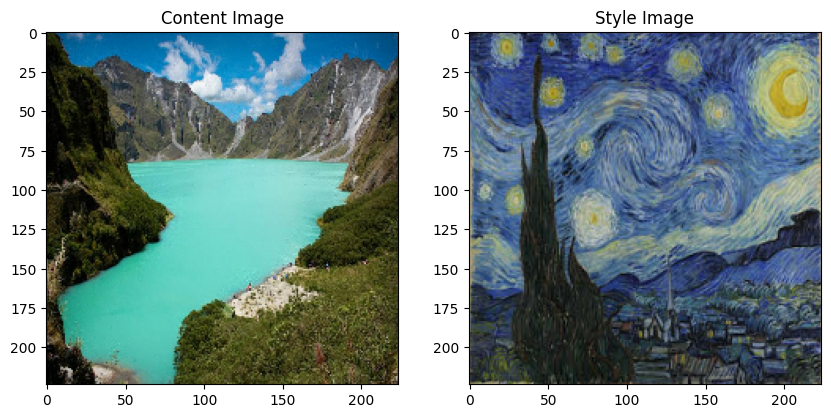

In [15]:
import IPython.display as display
import time


# Content and style images
content_path = './images/lake.jpg'
style_path = './images/starry.jpg'

#function to load and preprocess input images
def load_img(path_to_img):
    max_dim = 512
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    long_dim = max(shape)
    scale = max_dim / long_dim
    new_shape = tf.cast(shape * scale, tf.int32)

    #img = tf.image.resize(img, new_shape)
    img = tf.image.resize(img, [224, 224])
    img = img[tf.newaxis, :]
    return img

content_image = load_img(content_path)
style_image = load_img(style_path)

def imshow(image, title=None):
    if len(image.shape) > 3:
        image = tf.squeeze(image, axis=0)
    plt.imshow(image)
    if title:
        plt.title(title)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')
plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')
plt.show()

We use the CNN part of pre-trained VGG16 for this activity. The following code snippet defines the layers used for content and style representation in a neural style transfer (NST) model. Only one layer (```block5_conv2```) is selected for content representation. Using a higher-level layer ensures that the content transfer focuses on the overall structure and objects in the image, rather than low-level details.

For the style representation, five layers are selected, one from each block of the VGG network. Using multiple style layers allows the model to capture style at different scales and levels of abstraction.

In [16]:
# Choose layers for content and style
content_layers = ['block4_conv2']
style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1']

The function ```get_model()``` is a crucial part of setting up the neural style transfer model. The function creates a new model based on a pre-trained VGG CNN, specifically tailored for neural style transfer. It first creates a list of output tensors from the VGG model by iterating through a combined list of ```style_layers``` and ```content_layers```. For each layer name, it retrieves the corresponding layer using ```vgg_cnn.get_layer(name)``` and collects the output of each selected layer. This results in a set of output tensors that represent the features extracted from both the style and content layers, which are essential for the neural style transfer process. It then creates a new Keras model where the input is the original input and the outputs are the list of layer outputs we collected in the previous step.


In [7]:
def get_model():
    outputs = [vgg_cnn.get_layer(name).output for name in style_layers + content_layers]
    model = tf.keras.Model([vgg_cnn.input], outputs)
    return model

**Gram Matrix Construction:** The gram_matrix function computes the Gram matrix of an input tensor, which is essential for capturing the style representation in neural style transfer. The function uses TensorFlow's einsum to perform a batched matrix multiplication of the input tensor, effectively calculating the outer product of the feature maps. The resulting Gram matrix reflects the correlations between different feature channels. After computing the Gram matrix, the function normalizes it by dividing by the total number of spatial locations in the input tensor, which is obtained by multiplying the height and width dimensions (the second and third elements of input_shape). This normalization ensures that the Gram matrix is scale-invariant and allows for meaningful comparisons between style representations.

In [8]:
def gram_matrix(input_tensor):
    result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
    input_shape = tf.shape(input_tensor)
    num_locations = tf.cast(input_shape[1] * input_shape[2], tf.float32)
    return result / num_locations

**Style and Content Loss Functions:**
The following code defines three functions related to calculating losses in a neural style transfer model.
1. style_loss(outputs, style_targets, style_weight):
  * Calculates the style loss between the output and target style features.
  * Uses the Gram matrix to compare style representations.
  * Scales the loss by the style weight and number of style layers.
2. content_loss(outputs, content_targets, content_weight):
  * Computes the content loss between the output and target content features.
  * Uses mean squared error to compare content representations.
  * Scales the loss by the content weight and number of content layers.
total_loss(outputs, style_targets, content_targets, style_weight, content_weight):
  * Combines the style and content losses to produce the total loss.
  * Calls the style_loss and content_loss functions and sums their results.
  
These functions are typically used in neural style transfer algorithms to quantify how well the generated image matches the desired style and content. The style loss ensures the stylistic elements are transferred, while the content loss preserves the structural content of the original image.

In [9]:
def style_loss(outputs, style_targets, style_weight):
  style_outputs = outputs[:len(style_layers)]
  style_loss = tf.add_n([tf.reduce_mean((gram_matrix(style_output) - gram_matrix(style_target))**2)
                           for style_output, style_target in zip(style_outputs, style_targets)])
  style_loss *= style_weight / len(style_layers)
  return style_loss

def content_loss(outputs, content_targets, content_weight):
  content_outputs = outputs[:len(content_layers)]

  content_loss = tf.add_n([tf.reduce_mean((content_output - content_target)**2)
                             for content_output, content_target in zip(content_outputs, content_targets)])
  content_loss *= content_weight / len(content_layers)
  return content_loss

def total_loss(outputs, style_targets, content_targets, style_weight, content_weight):

    return style_loss(outputs, style_targets, style_weight) + content_loss(outputs, content_targets, content_weight)

The ```style_transfer()``` function implements the core algorithm for neural style transfer. It takes content and style images as inputs and iteratively generates a stylized image. The function initializes a pre-trained model, sets its layers as non-trainable, and extracts style and content targets. It then creates an Adam optimizer and initializes the stylized image as a variable. The main training loop uses a custom train_step function, which calculates the total loss (combining style and content losses) and applies gradients to update the stylized image. The process repeats for a specified number of iterations, with periodic visual updates of the stylized image. The function employs TensorFlow's @tf.function decorator for improved performance and uses gradient tape for automatic differentiation. Finally, it returns the generated stylized image that combines the content of the original image with the style of the reference image.

Your task: Complete the code snippet below by filling in the blanks. Carefully consider the context of each line to determine the appropriate terms or concepts that fit.

**Instructions:**
1. The first blank refers to a TensorFlow feature that records operations for automatic differentiation.
2. The second blank is the model being used to generate outputs from the current stylized image.
3. The third blank is where you pass the outputs and targets to compute the total loss.
4. The fourth blank involves calculating the gradient of the loss with respect to the stylized image.
5. The fifth blank is where you apply the gradients using the optimizer.
6. The sixth blank should be the variable representing the stylized image being updated.
7. The last part ensures that pixel values of the stylized image remain within a valid range.

In [10]:
#Actrivity 6: Implement style transfer (12 Points)
def clip_0_1(image):
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

def tensor_to_image(tensor):
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        tensor = tensor[0]
    return PIL.Image.fromarray(tensor)

def style_transfer(content_image, style_image, num_iterations=1000, content_weight=1e4, style_weight=1e-2):
    model = get_model()
    for layer in model.layers:
        layer.trainable = False

    style_targets = model(style_image)[:len(style_layers)]
    content_targets = model(content_image)[:len(content_layers)]

    opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

    stylized_image = tf.Variable(content_image)


    @tf.function()
    def train_step():
        with tf.GradientTape() as tape:
          outputs = model(stylized_image)
          loss = total_loss(outputs, style_targets, content_targets, style_weight, content_weight)

        grad = tape.gradient(loss, stylized_image)
        opt.apply_gradients([(grad, stylized_image)])
        stylized_image.assign(clip_0_1(stylized_image))

    # Main training loop
    for i in range(num_iterations):
        train_step()
        if i % 100 == 0:
            display.clear_output(wait=True)
            imshow(stylized_image.read_value())
            plt.title(f"Iteration {i}")
            plt.show()

    return stylized_image

Driver code for NST is provided below.

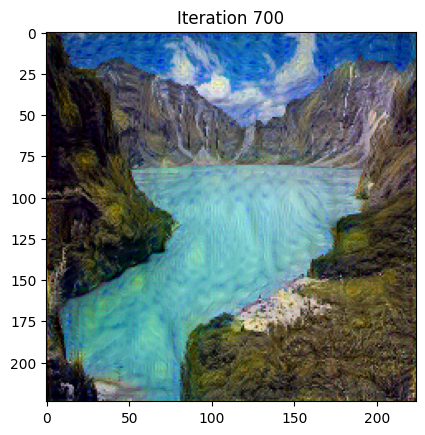

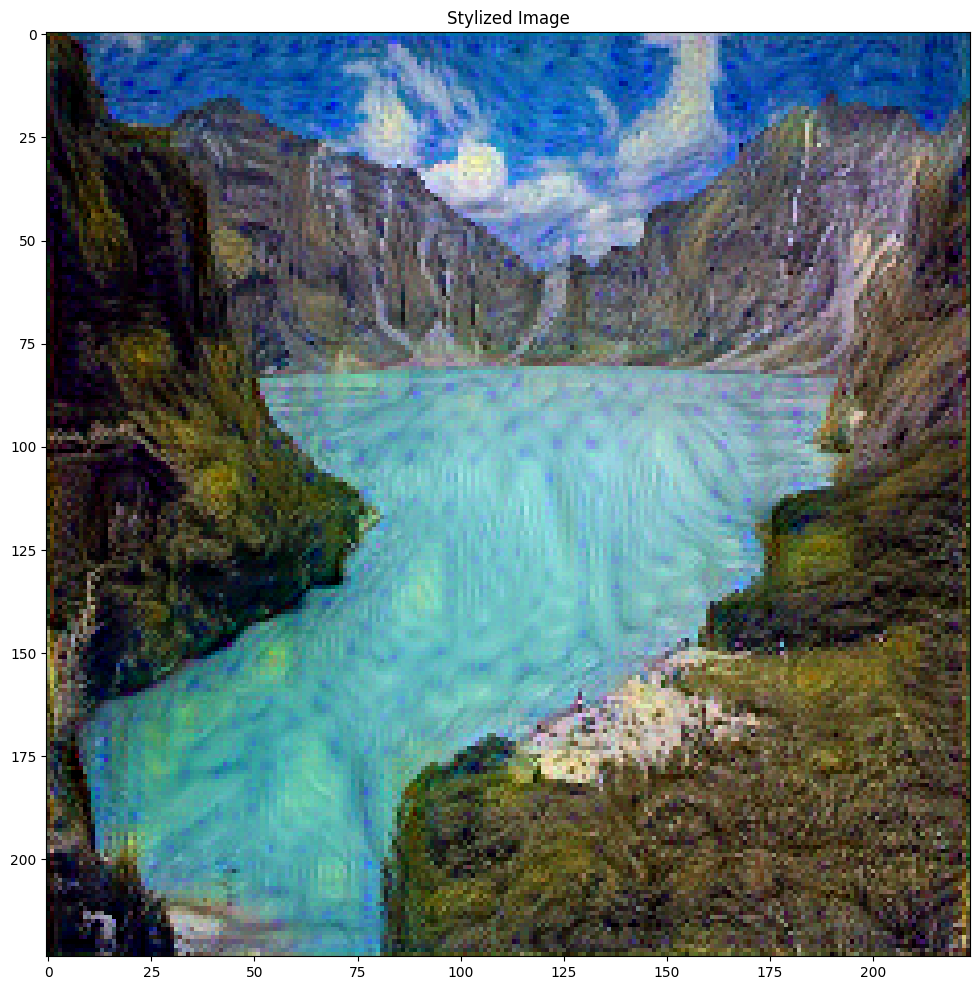

In [17]:
# Run style transfer
stylized_image = style_transfer(content_image, style_image, num_iterations=750, content_weight=1e6, style_weight=1e4)

# Display final result
plt.figure(figsize=(12, 12))
imshow(stylized_image, 'Stylized Image')
plt.show()

**Question 4 (8 Points):** For your Neural Style Transfer activity, select two pairs of images: one pair consisting of a Content Image A and a Style Image A, and another pair with a Content Image B and a Style Image B. Create at least three stylized images for each pair by adjusting parameters such as the number of iterations, content weight, style weight, content layers, and style layers. Document your process by recording the parameters used for each attempt and noting how changes affect the output in the below **response** section. After experimenting, choose the best stylized image from each pair and justify your selection based on the balance of content preservation and style transfer. Include your original images along with your two best stylized images under ```NST``` folder and submit it along with your colab notebook.

**Response**

# Content Image A = butterfly.jpg, Style Image A = smu.jpg
## Experiment 1:
- **Content Layers:** `['block4_conv1']`
- **Style Layers:** `['block2_conv1', 'block3_conv1', 'block5_conv1']`
- **Iterations:** `750`
- **Content Weight:** `5e4`
- **Style Weight:** `1e−3`
- **Note:** Mild style transfer with subtle texture blending. Increased iterations for better results.

## Experiment 2:
- **Content Layers:** `['block3_conv1']`
- **Style Layers:** `['block2_conv1', 'block3_conv1', 'block4_conv1']`
- **Iterations:** `1000`
- **Content Weight:** `1e4`
- **Style Weight:** `1e1`
- **Note:** Stylized image has more vibrant texture mapping, but edges appear distorted.

## Experiment 3:
- **Content Layers:** `['block5_conv1']`
- **Style Layers:** `['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1']`
- **Iterations:** `1500`
- **Content Weight:** `1e5`
- **Style Weight:** `1e2`
- **Note:** Stylized image achieved a harmonious balance. Submitting this for the final output.

---

# Content Image B = lake.jpg, Style Image B = starry.jpg
## Experiment 1:
- **Content Layers:** `['block5_conv2']`
- **Style Layers:** `['block2_conv1', 'block4_conv1', 'block5_conv1']`
- **Iterations:** `500`
- **Content Weight:** `1e4`
- **Style Weight:** `1e2`
- **Note:** Slight overexposure of style; reducing style weight for clarity.

## Experiment 2:
- **Content Layers:** `['block5_conv2']`
- **Style Layers:** `['block3_conv1', 'block4_conv1', 'block5_conv1']`
- **Iterations:** `1000`
- **Content Weight:** `1e4`
- **Style Weight:** `1e0`
- **Note:** Achieved a better balance between content and style.

## Experiment 3:
- **Content Layers:** `['block4_conv2']`
- **Style Layers:** `['block1_conv1', 'block2_conv1', 'block3_conv1']`
- **Iterations:** `750`
- **Content Weight:** `1e6`
- **Style Weight:** `1e4`
- **Note:** Highly detailed stylization with vivid colors and textures. Submitting this image for the final output.


#**7. Evaluation Details**
The assignment will be discussed in the recitations on Nov. 6 and Nov. 20. You will get a total of 16 days to complete the activities.  Attendance in each recitation is mandatory to get marks for the graded activities. We will record your attendance. If you complete all the activities in the first recitation itself, then the second recitation is optional. You have to read the instructions, refer to the slides and do all the exercises. The marker reserves the prerogative to pose supplementary questions for elucidation when deemed necessary.

**NOTE** If you are unable to attend the recitation, please notify the instructor prior to the session. Absences due to illness or other valid reasons will be taken into consideration.

#**8. References**
1. Mordvintsev et al.,Deepdream-a code example for visualizing neural networks, 2015
2. Gatys et al.,A Neural Algorithm of Artistic Style,2015
3. Zeiler et al., Visualizing and Understanding Convolutional Networks, 2013
4. Simonyan et al., Very Deep Convolutional Networks for Large-Scale Image Recognition, 2014
5. Szegedy et al., Rethinking the Inception Architecture for Computer Vision, 2015
6. Tensorflow GradientTape- https://www.tensorflow.org/api_docs/python/tf/GradientTape